In [1]:
import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from scipy.stats import pearsonr
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/2372193045.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
df = pd.read_csv('../dataset/df_encoded.csv')

In [3]:
df_rescaled = pd.read_csv('../dataset/df_rescaled.csv')
df_pca = pd.read_csv('../dataset/df_pca.csv')

In [4]:
X = df_pca.drop(columns = 'Churn')
y = df_pca['Churn']

# K-Means

Choice of K

In [5]:
sse_list = list()
max_k = 50
for k in range(2, max_k + 1):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=300)
    kmeans.fit(X)
    
    sse = kmeans.inertia_
    sse_list.append(sse)

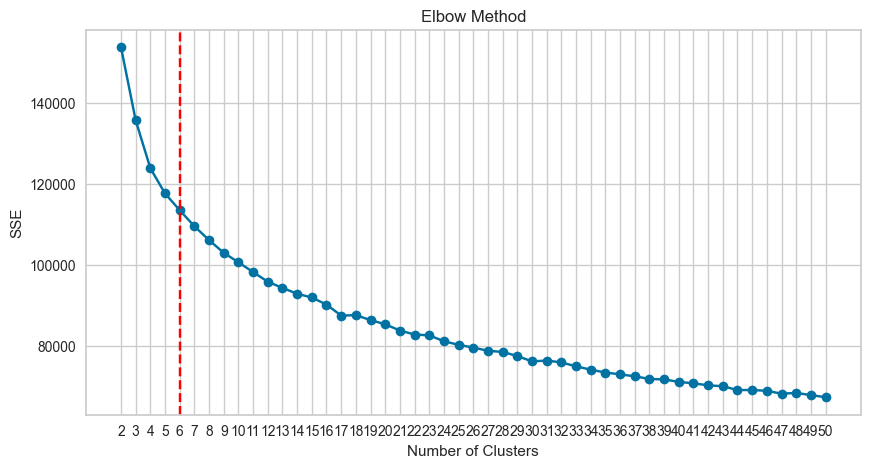

In [6]:
# plot the elbow method
plt.figure(figsize=(10, 5))
plt.plot(range(2, max_k + 1), sse_list, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('SSE')
plt.xticks(range(2, max_k + 1))
plt.grid(True)
plt.axvline(x=6, color='red', linestyle='--', label='Optimal k')
plt.show()

In [7]:
# apply kmeans with 6 clusters
kmeans = KMeans(n_clusters=6, n_init=10, max_iter=300)
kmeans.fit(X)

KMeans(n_clusters=6, n_init=10)

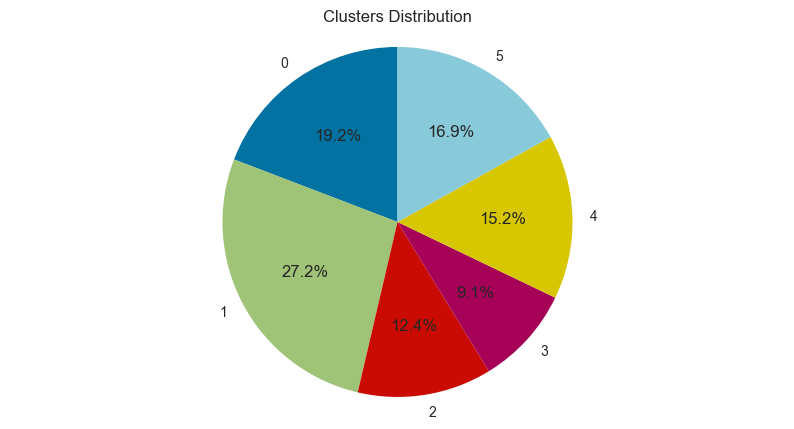

In [8]:
df_rescaled['clusters'] = kmeans.labels_
df_pca['clusters'] = kmeans.labels_
# plot the clusters with plotly
plt.figure(figsize=(10, 5))
pie = df_rescaled.groupby('clusters').size().reset_index(name='counts')
pie_labels = pie['clusters'].astype(str)
plt.pie(pie['counts'], labels=pie_labels, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Clusters Distribution')
plt.show()

Plot the clusters in the PCA space

In [9]:
#create color map
colors = sns.color_palette('colorblind', 6)


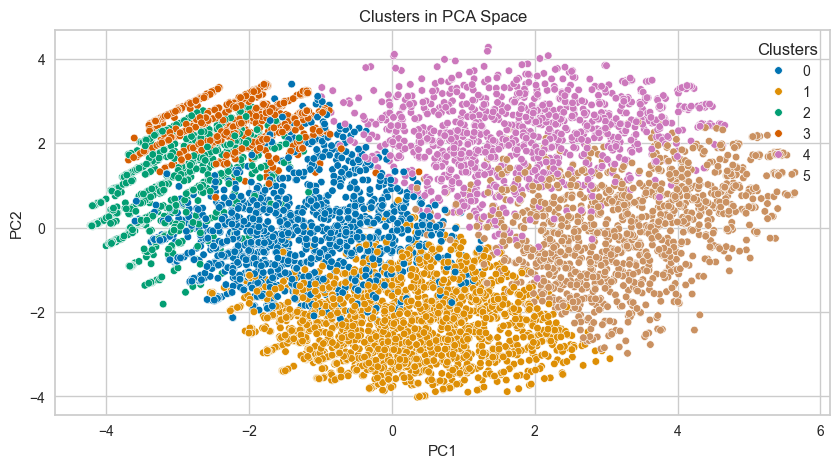

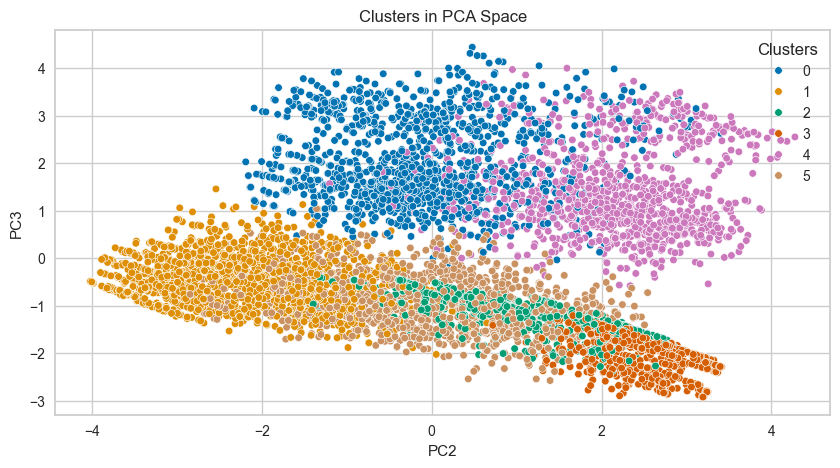

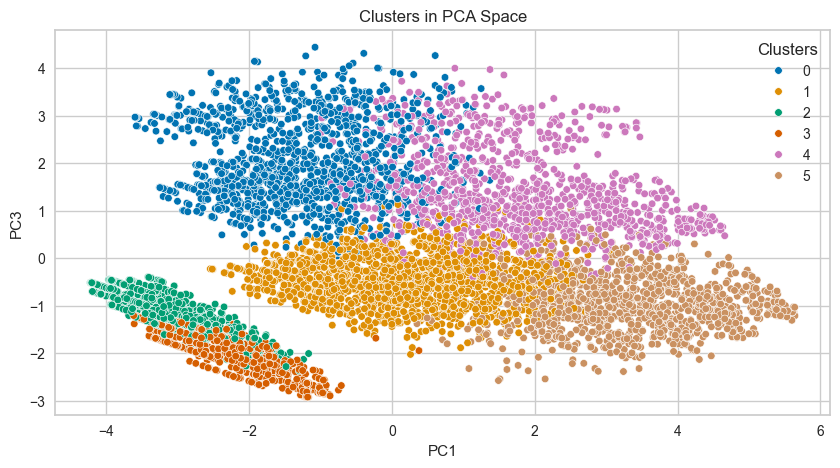

In [10]:
# plot the clusters in the pca space
plt.figure(figsize=(10, 5))
sns.scatterplot(x='PC1', y='PC2', hue='clusters', data=df_pca, palette=colors, s=30)
plt.title('Clusters in PCA Space')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
sns.scatterplot(x='PC2', y='PC3', hue='clusters', data=df_pca, palette=colors, s=30)
plt.title('Clusters in PCA Space')
plt.xlabel('PC2')
plt.ylabel('PC3')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
sns.scatterplot(x='PC1', y='PC3', hue='clusters', data=df_pca, palette=colors, s=30)
plt.title('Clusters in PCA Space')
plt.xlabel('PC1')
plt.ylabel('PC3')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.show()

In [11]:
#3d plot
import plotly.express as px
fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='clusters', title='Clusters in PCA Space')
fig.update_traces(marker=dict(size=5))
fig.update_layout(scene=dict(
                    xaxis_title='PC1',
                    yaxis_title='PC2',
                    zaxis_title='PC3'))
fig.show()


Let's understand the feature distribution in each cluster

In [12]:

# get boolean features in dataset
bool_features = df_rescaled.select_dtypes(include=[bool]).columns
# get numerical features in dataset excluding clusters
num_features = df_rescaled.select_dtypes(include=[np.number]).columns
num_features = num_features.drop('clusters')

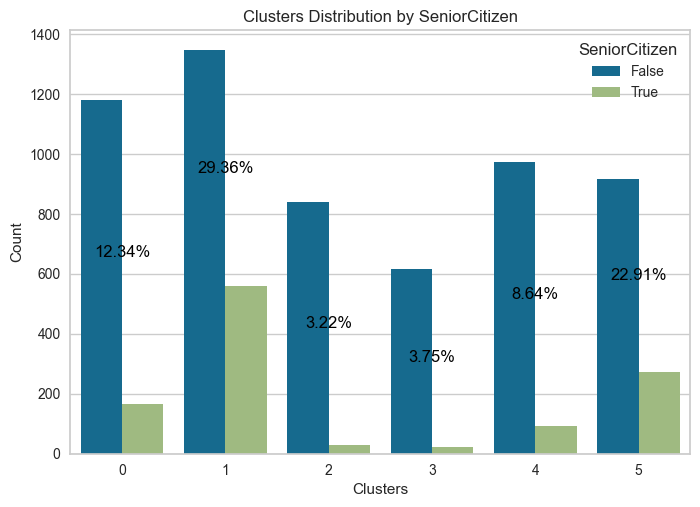

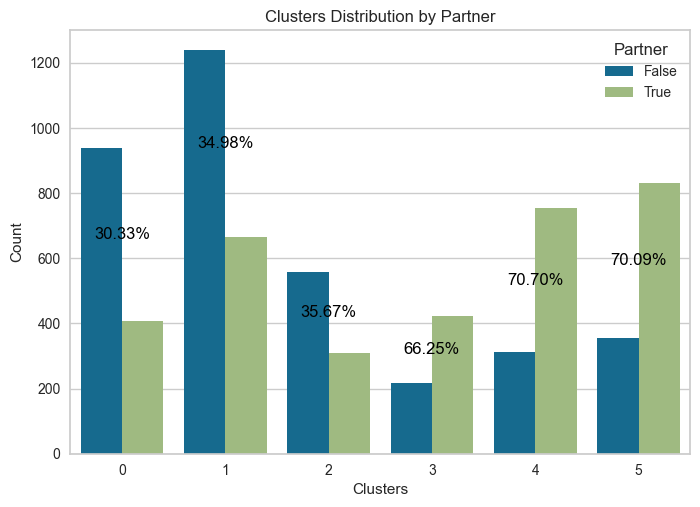

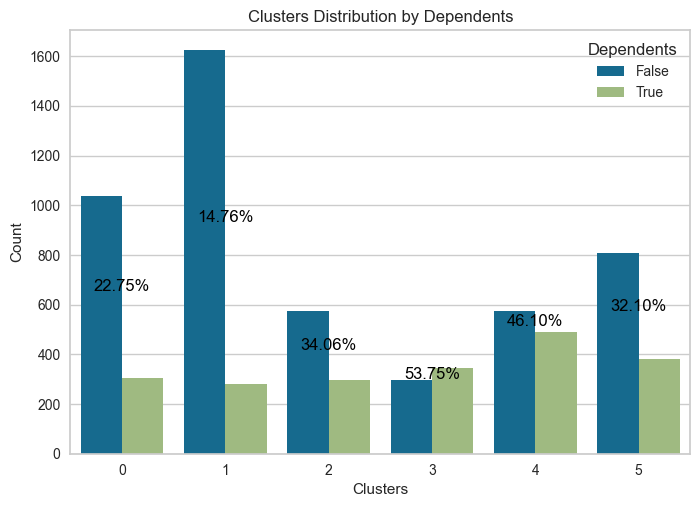

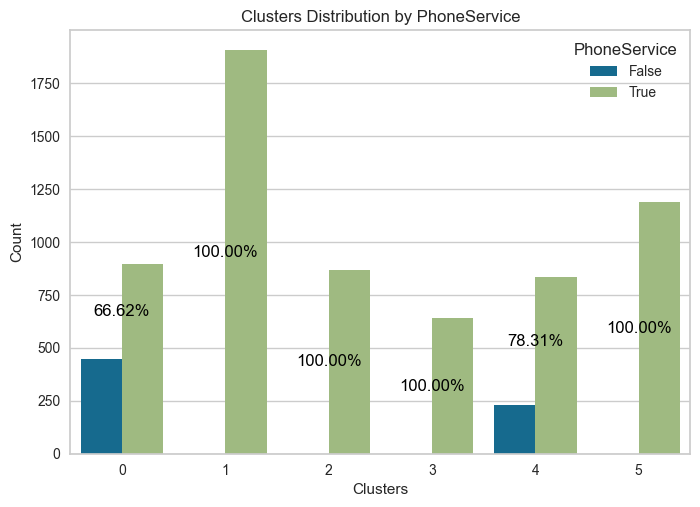

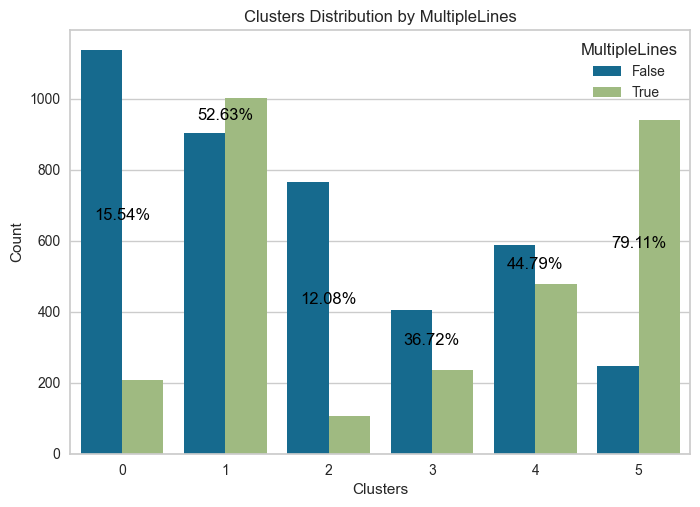

...

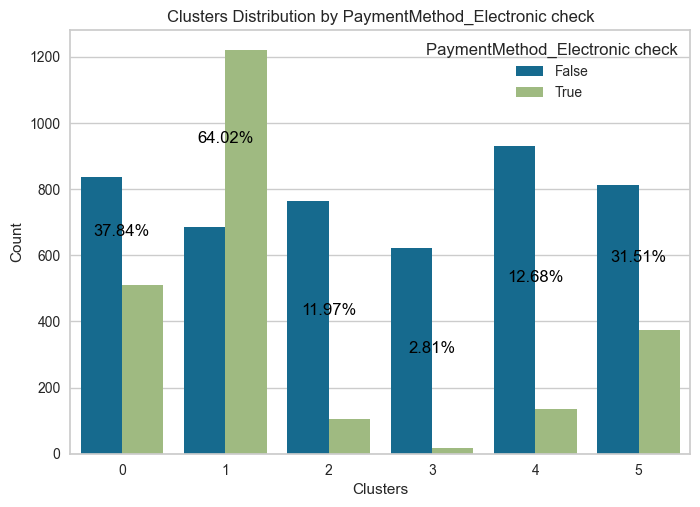

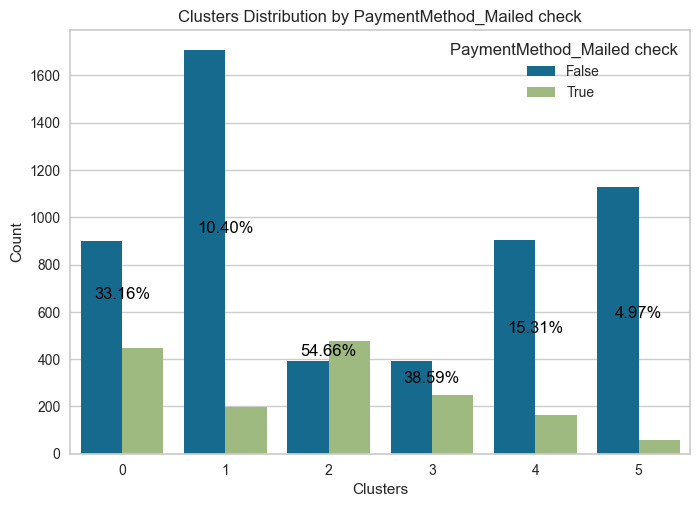

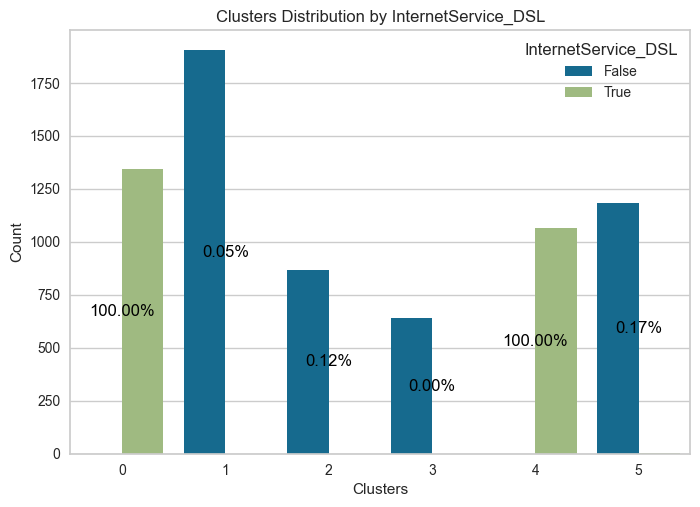

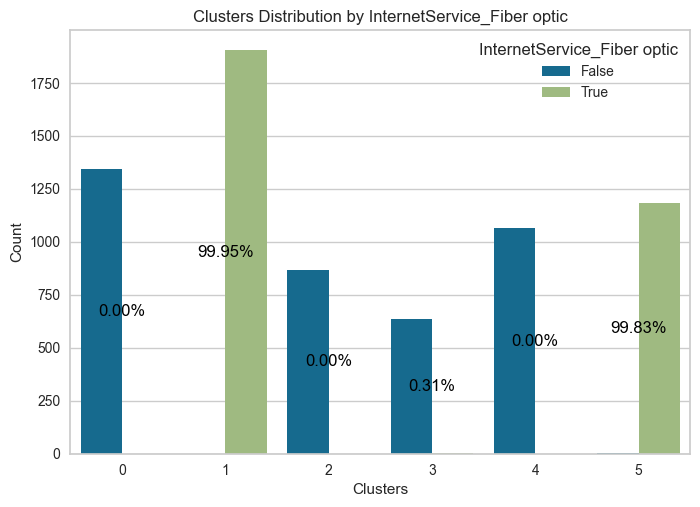

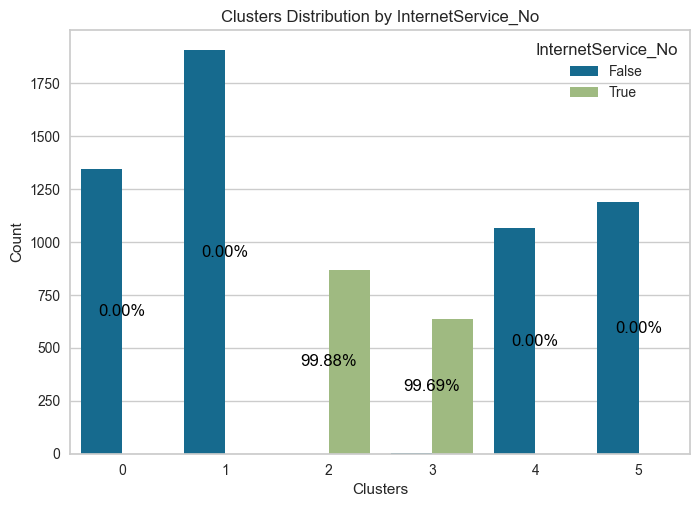

In [13]:
# bar plots for the clusters

#save variance of each feature in a dictionary
var_dict = defaultdict(list)
for col in bool_features:
    # bar plot of the clusters
    pl = sns.countplot(df_rescaled, x='clusters', hue=col)
    plt.title(f'Clusters Distribution by {col}')
    plt.xlabel('Clusters')
    plt.ylabel('Count')
    plt.legend(title=col)
    list_of_percentages = list()
    #for each cluster display on bin relative percentage of True/False values in that cluster
    for i in range(6):
        total = df_rescaled[df_rescaled['clusters'] == i][col].count()
        true = df_rescaled[df_rescaled['clusters'] == i][col].sum()
        false = total - true
        plt.text(i, total/2, f'{true/total:.2%}', ha='center', va='center', color='black')
        list_of_percentages.append(true/total)
    #calculate variance of the percentages
    var = np.var(list_of_percentages)
    var_dict[col].append(var)

    
    plt.show()


In [14]:
# print the variance of each feature in order
# sort the dictionary by value
sorted_var_dict = sorted(var_dict.items(), key=lambda x: x[1], reverse=True)
# print the sorted dictionary
for key, value in sorted_var_dict:
    print(f'{key}: {value[0]:.4f}')

InternetService_DSL: 0.2218
InternetService_Fiber optic: 0.2214
InternetService_No: 0.2213
Contract_Month-to-month: 0.1487
Contract_Two year: 0.1348
StreamingMovies: 0.0893
StreamingTV: 0.0891
DeviceProtection: 0.0867
OnlineBackup: 0.0775
TechSupport: 0.0762
OnlineSecurity: 0.0700
MultipleLines: 0.0517
PaymentMethod_Electronic check: 0.0421
PaperlessBilling: 0.0389
Churn: 0.0355
Contract_One year: 0.0340
Partner: 0.0317
PaymentMethod_Mailed check: 0.0305
PhoneService: 0.0180
Dependents: 0.0173
SeniorCitizen: 0.0094
PaymentMethod_Credit card (automatic): 0.0088
PaymentMethod_Bank transfer (automatic): 0.0081
IsMale: 0.0001


From here we see that the variable IsMale is equally distributed in all clusters: no useful information from this variable

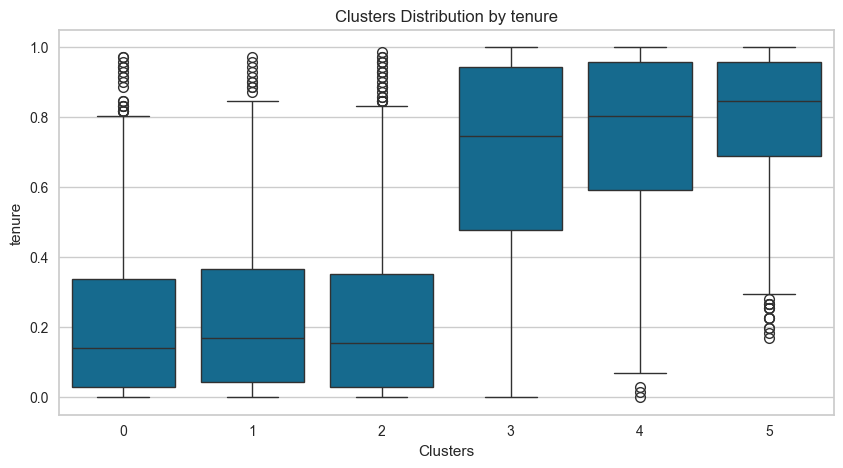

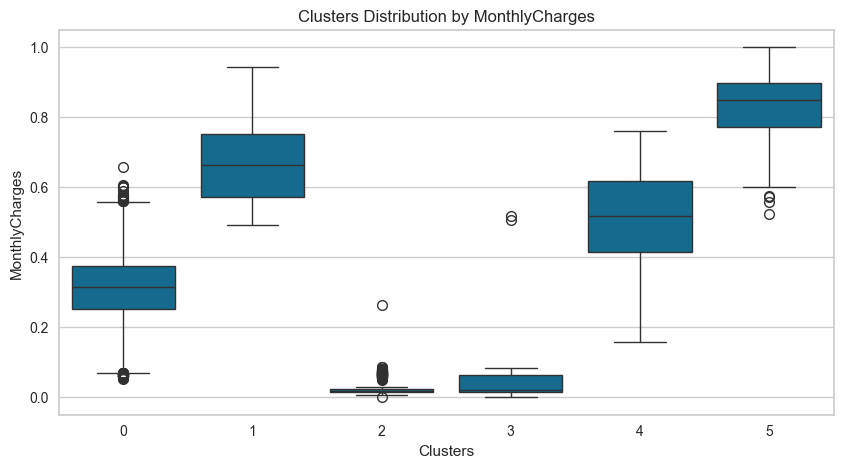

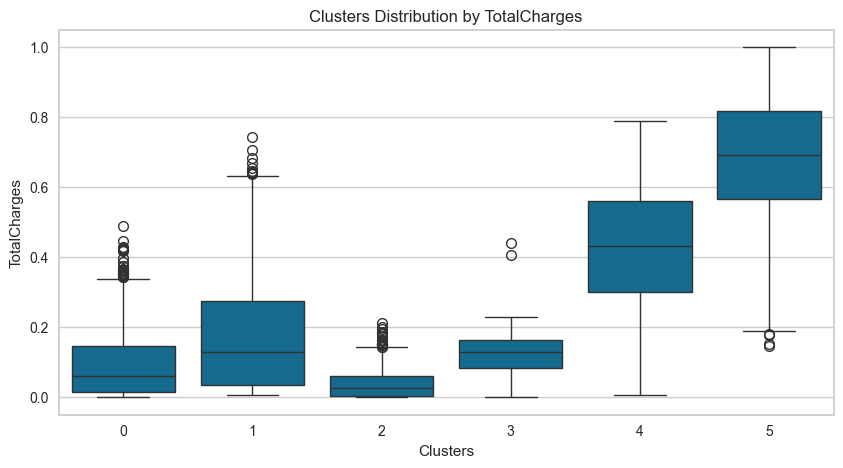

In [15]:
# box plots for numerical features
for col in num_features:
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df_rescaled, x='clusters', y=col)
    plt.title(f'Clusters Distribution by {col}')
    plt.xlabel('Clusters')
    plt.ylabel(col)
    plt.show()

In [16]:
# for each cluster print the mean and std of the numerical features, as well as the relative count (in percentage) of the boolean features
def print_cluster_info(df, cluster_col, bool_features, num_features):
    for cluster in df[cluster_col].unique():
        print(f"Cluster {cluster}:")
        # get the rows of the cluster
        cluster_rows = df[df[cluster_col] == cluster]
        # print the mean and std of the numerical features
        print("Numerical features:")
        for col in num_features:
            mean = cluster_rows[col].mean()
            std = cluster_rows[col].std()
            print(f"{col}: mean = {mean:.2f}, std = {std:.2f}")
        # print the count of the boolean features
        print("Boolean features:")
        for col in bool_features:
            if col=="IsMale":
                continue
            try:
                count = cluster_rows[col].value_counts(normalize=True)
                true_percent = count.get(True, 0) * 100
                false_percent = count.get(False, 0) * 100
                print(f"{col}: {true_percent:.2f}% True, {false_percent:.2f}% False")
            except Exception as e:
                print(f"Errore per la colonna {col}: {e}")
        print("\n")
print_cluster_info(df_rescaled, 'clusters', bool_features, num_features)

Cluster 0:
Numerical features:
tenure: mean = 0.21, std = 0.22
MonthlyCharges: mean = 0.31, std = 0.12
TotalCharges: mean = 0.09, std = 0.09
Boolean features:
SeniorCitizen: 12.34% True, 87.66% False
Partner: 30.33% True, 69.67% False
Dependents: 22.75% True, 77.25% False
PhoneService: 66.62% True, 33.38% False
MultipleLines: 15.54% True, 84.46% False
OnlineSecurity: 29.89% True, 70.11% False
OnlineBackup: 28.77% True, 71.23% False
DeviceProtection: 22.30% True, 77.70% False
TechSupport: 27.81% True, 72.19% False
StreamingTV: 22.08% True, 77.92% False
StreamingMovies: 23.72% True, 76.28% False
PaperlessBilling: 57.62% True, 42.38% False
Churn: 30.11% True, 69.89% False
Contract_Month-to-month: 86.77% True, 13.23% False
Contract_One year: 11.60% True, 88.40% False
Contract_Two year: 1.64% True, 98.36% False
PaymentMethod_Bank transfer (automatic): 14.28% True, 85.72% False
PaymentMethod_Credit card (automatic): 14.72% True, 85.28% False
PaymentMethod_Electronic check: 37.84% True, 62.16

In [62]:

def plot_cluster_distributions(
    df, 
    feature_variance,
    cluster_col='clusters'
):
    """
    Visualizza per ciascun cluster:
      - la frazione di True per le variabili booleane
      - i boxplot per le variabili numeriche

    Parametri:
        df (pd.DataFrame): il DataFrame da analizzare
        cluster_col (str): il nome della colonna che identifica i cluster
        show (bool): se True chiama plt.show() dopo ogni figura
    """

    # Ordina le feature per varianza decrescente
    feature_variance = pd.Series(feature_variance).sort_values(ascending=False)
     # Seleziona feature presenti nel DataFrame
    boolean_cols = [
        col for col in feature_variance.index 
        if col in df.columns and df[col].dropna().isin([True, False]).all()
    ]

    numeric_cols = [
        col for col in df.columns 
        if col not in boolean_cols + [cluster_col] and pd.api.types.is_numeric_dtype(df[col])
    ]
    # drop from the numeric_cols the columns that starts with clusters
    numeric_cols = [col for col in numeric_cols if not col.startswith('clusters')]


    clusters = sorted(df[cluster_col].dropna().unique())


    for cluster in clusters:
        cluster_df = df[df[cluster_col] == cluster]

        fig = plt.figure(constrained_layout=True, figsize=(14, 6))
        gs = fig.add_gridspec(1, 2, width_ratios=[len(boolean_cols), len(numeric_cols)])
        fig.suptitle(f'Cluster {cluster}', fontsize=16)

        # Bar plot per le booleane
        ax1 = fig.add_subplot(gs[0])
        if boolean_cols:            
            true_means = cluster_df[boolean_cols].mean()
            sns.barplot(x=true_means.index, y=true_means.values, ax=ax1)
            ax1.set_ylim(0, 1)
            ax1.set_title('Fraction of True (Boolean Variables)')
            ax1.set_ylabel('Fraction')
            ax1.set_xticks(range(len(true_means)))
            ax1.set_xticklabels(true_means.index, rotation=45, ha='right')
        else:
            ax1.set_visible(False)

        # Boxplot per le numeriche
        ax2 = fig.add_subplot(gs[1])
        if numeric_cols:
            sns.boxplot(data=cluster_df[numeric_cols], ax=ax2)
            ax2.set_title('Boxplot (Numeric Variables)')
            ax2.set_xticks(range(len(numeric_cols)))
            ax2.set_xticklabels(numeric_cols, rotation=45, ha='right')  
        else:
            ax2.set_visible(False)

        plt.tight_layout()
        plt.show()

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/1123301270.py:64: UserWarning:

The figure layout has changed to tight



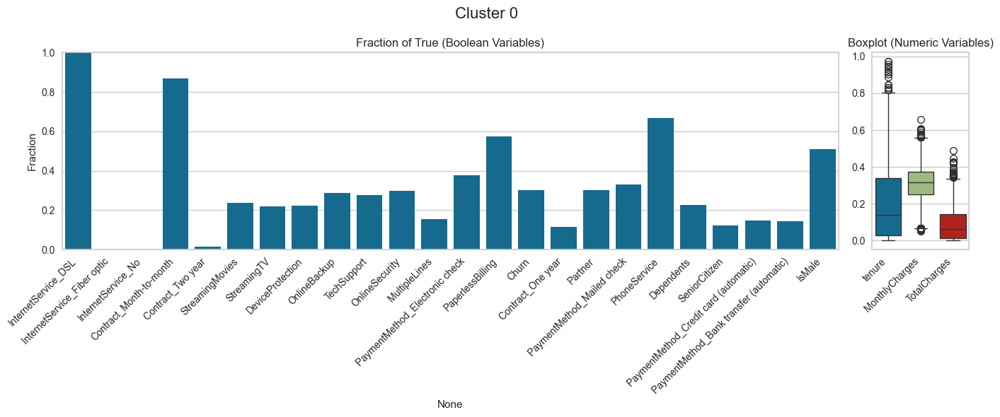

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/1123301270.py:64: UserWarning:

The figure layout has changed to tight



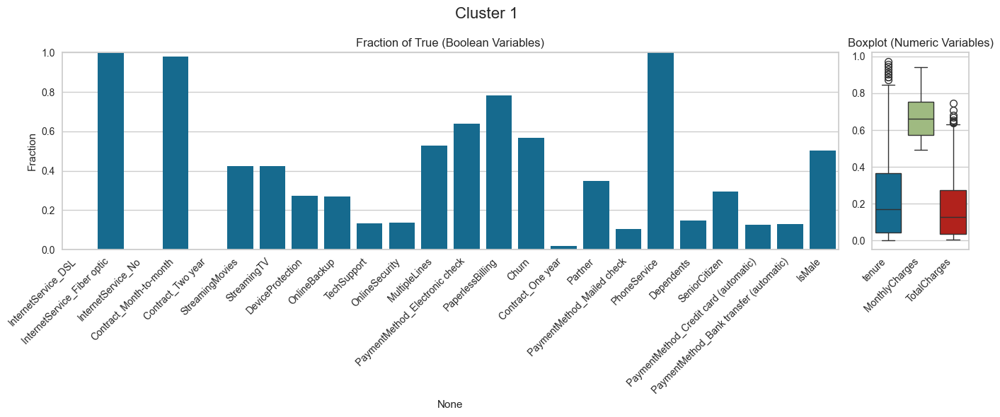

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/1123301270.py:64: UserWarning:

The figure layout has changed to tight



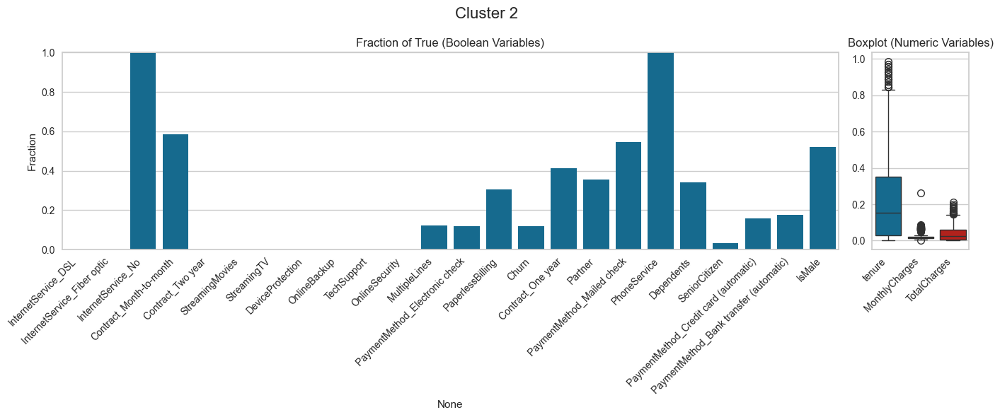

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/1123301270.py:64: UserWarning:

The figure layout has changed to tight



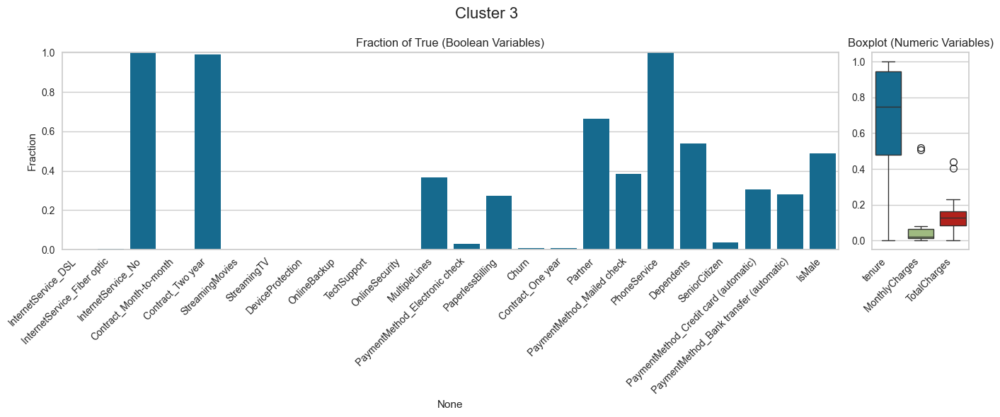

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/1123301270.py:64: UserWarning:

The figure layout has changed to tight



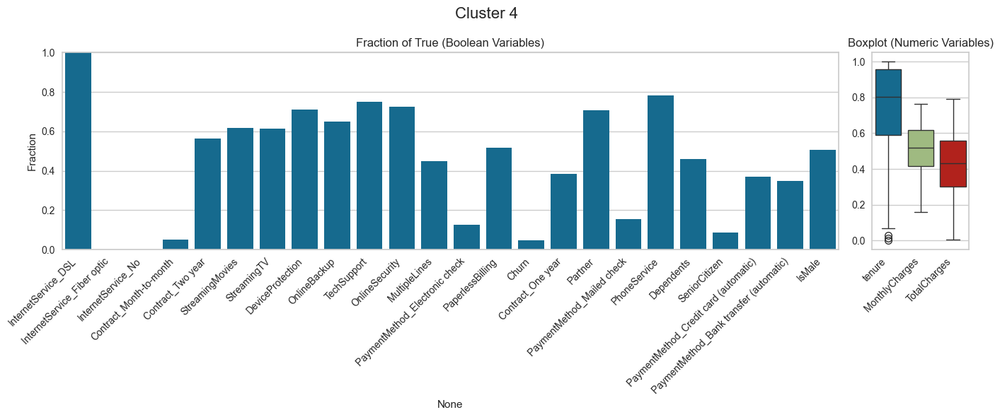

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/1123301270.py:64: UserWarning:

The figure layout has changed to tight



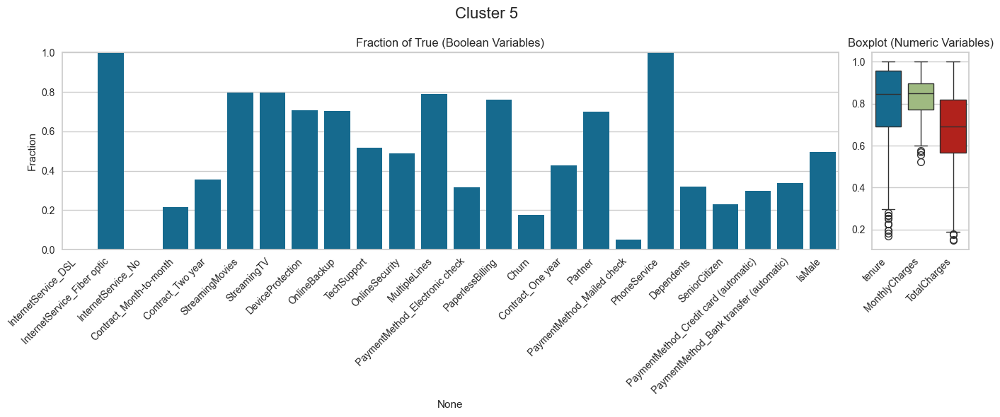

In [18]:
plot_cluster_distributions(df_rescaled, var_dict, 'clusters')

ChatGPT interpretation:

🔵 Cluster 0 – "Nuovi clienti offline a basso costo"
Tenure basso (0.42), spesa mensile molto bassa (0.03).

Nessun servizio digitale attivo (0% su tutto).

Quasi tutti hanno PhoneService, ma nessun Internet.

Churn molto basso (7.2%), probabilmente clienti poco esigenti e poco coinvolti.

Contratti vari, tendenza verso quelli lunghi.

Potrebbero essere utenti anziani tecnologicamente distanti o clienti con esigenze minime.

🟢 Cluster 1 – "Clienti fidelizzati e ben serviti"
Tenure più alto di tutti (0.88) e alta spesa mensile (0.72).

Tanti servizi digitali attivi (oltre 70% su tutto), alto engagement.

Contratti a lungo termine (quasi 94% non sono mensili).

Churn molto basso (5.4%) → cluster ideale per fidelizzazione e up-selling.

Clientela con esigenze digitali evolute, probabilmente soddisfatta.

🟣 Cluster 2 – "Nuovi clienti con fibra o DSL, ma a rischio"
Tenure molto basso (0.20), spesa moderata (0.38).

Hanno PhoneService e DSL quasi tutti, ma servizi digitali ancora scarsi.

Contratti mensili (87.5%) → più flessibili, meno fidelizzati.

Churn medio-alto (26.4%): è una zona critica in cui intervenire.

Target per campagne di retention e promozioni sui servizi digitali.

🟡 Cluster 3 – "Clienti giovani senza linea telefonica, solo DSL"
Tenure basso (0.40), spesa bassa (0.22).

0% PhoneService e MultipleLines, tutti su DSL.

Uso moderato dei servizi digitali (38–41%).

Contratti distribuiti, ma il 58% è mensile.

Churn medio (26.4%) → cautela: sono potenzialmente instabili ma economici.

Potrebbero essere studenti o clienti budget-oriented.

🔴 Cluster 4 – "Clienti instabili, alti costi e alta disdetta"
Tenure medio-basso (0.28), spesa molto alta (0.68).

Quasi tutti con Fiber Optic (99.9%), ma poco uso di servizi digitali di sicurezza.

Altissimo churn (55.2%) → il più a rischio.

Quasi tutti con contratto mensile.

Probabile mismatch tra costo elevato e valore percepito → urgente agire su fidelizzazione o miglioramento dell’offerta.

🔵 Cluster 5 – "Clienti consolidati con uso intenso dei servizi"
Tenure medio-alto (0.69), alta spesa (0.70).

Alta penetrazione di servizi digitali (50–67%).

Tutti con contratti One year.

Churn molto basso (15.5%) → gruppo molto redditizio.

Perfetti per fidelizzazione ulteriore, potrebbero essere convertiti a due anni.

# DBSCAN

In [19]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

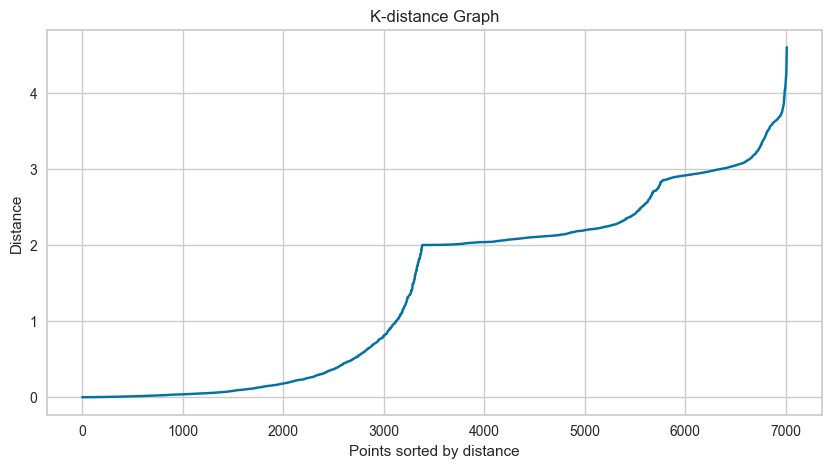

In [51]:
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)
distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.figure(figsize=(10, 5))
plt.plot(distances)
plt.title('K-distance Graph')
plt.xlabel('Points sorted by distance')
plt.ylabel('Distance')
plt.grid(True)
plt.show()


From this graph we see that there are very different densities in the graph. One option would be to split the dataset according to these densities and perform different BSCANs with different epsilon. Let's try one for the sake of the exercise

In [52]:
dbscan = DBSCAN(eps=3.1, min_samples=50)
dbscan.fit(X)

df_rescaled['clusters_dbscan'] = dbscan.labels_
df_pca['clusters_dbscan'] = dbscan.labels_

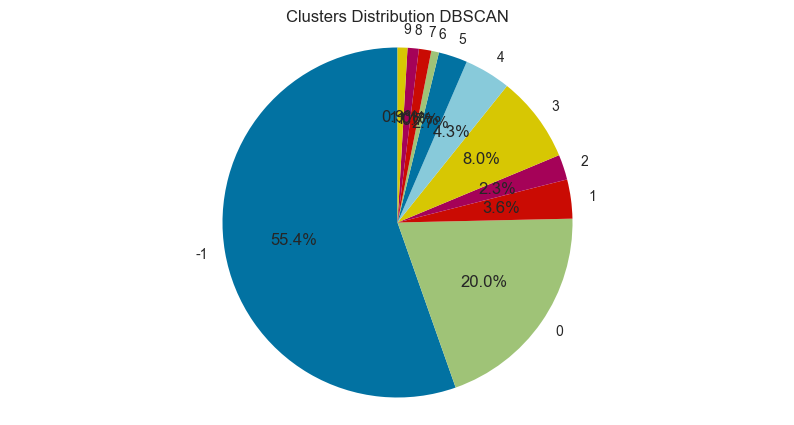

In [59]:
# pie chart with the number of points in each cluster
plt.figure(figsize=(10, 5))
pie = df_rescaled.groupby('clusters_dbscan').size().reset_index(name='counts')
pie_labels = pie['clusters_dbscan'].astype(str)
plt.pie(pie['counts'], labels=pie_labels, startangle=90,autopct='%1.1f%%')
plt.axis('equal')
plt.title('Clusters Distribution DBSCAN')
plt.show()

In [60]:
# print total number of points in each cluster
clusters = df_rescaled['clusters_dbscan'].unique()
for cluster in clusters:
    count = df_rescaled[df_rescaled['clusters_dbscan'] == cluster].shape[0]
    print(f'Cluster {cluster}: {count} points')

Cluster 9: 64 points
Cluster -1: 3883 points
Cluster 4: 300 points
Cluster 0: 1399 points
Cluster 1: 253 points
Cluster 8: 73 points
Cluster 2: 163 points
Cluster 7: 80 points
Cluster 3: 558 points
Cluster 5: 187 points
Cluster 6: 50 points


In [53]:
unique_labels, unique_counts = np.unique(dbscan.labels_, return_counts=True)
print(max(unique_labels))

9


In [54]:
unique_labels = unique_labels[unique_labels != -1]

In [24]:
unique_labels

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [25]:
#remove outliers
df_pca_dbscan = df_pca[df_pca['clusters_dbscan'] != -1]
df_rescaled_dbscan = df_rescaled[df_rescaled['clusters_dbscan'] != -1]

In [26]:
#define color palette
colors = sns.color_palette('colorblind', len(unique_labels))

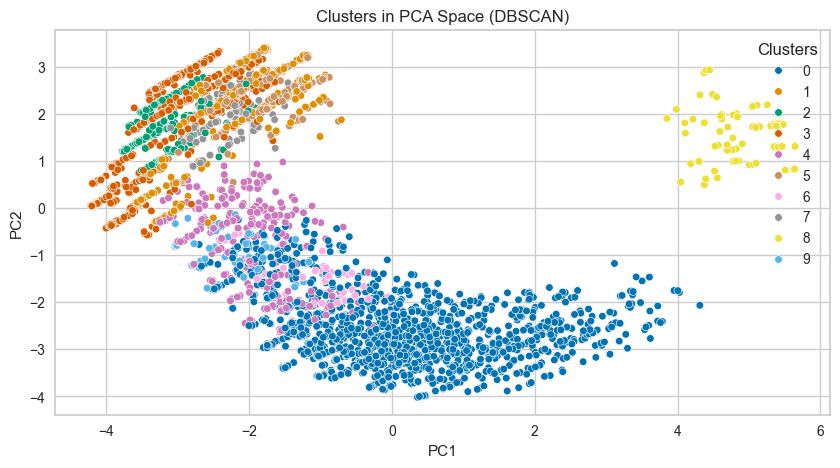

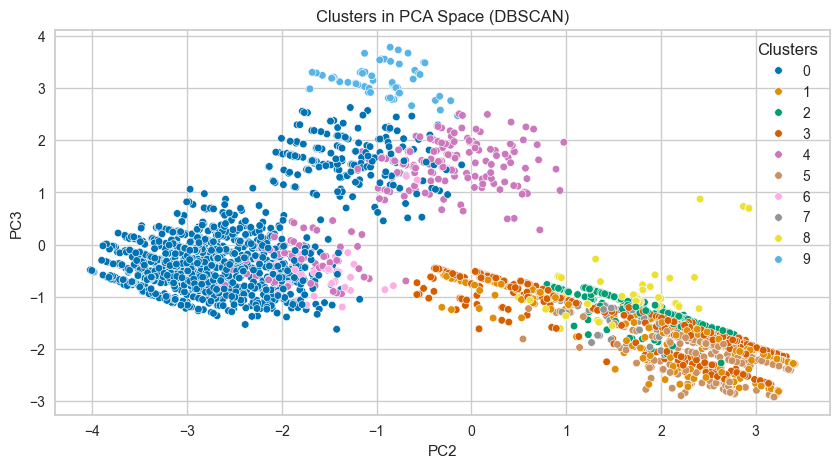

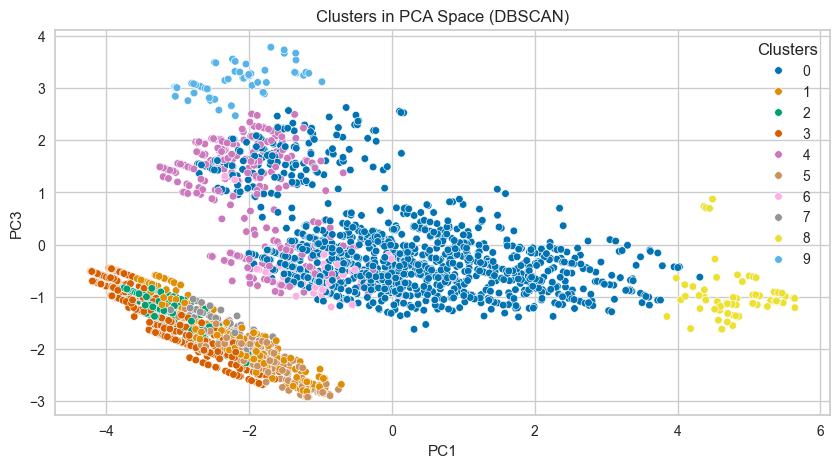

In [27]:
# plot the clusters found in the pca space
plt.figure(figsize=(10, 5))
sns.scatterplot(x='PC1', y='PC2', hue='clusters_dbscan', data=df_pca_dbscan, palette=colors, s=30)
plt.title('Clusters in PCA Space (DBSCAN)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 5))
sns.scatterplot(x='PC2', y='PC3', hue='clusters_dbscan', data=df_pca_dbscan, palette=colors, s=30)
plt.title('Clusters in PCA Space (DBSCAN)')
plt.xlabel('PC2')
plt.ylabel('PC3')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 5))
sns.scatterplot(x='PC1', y='PC3', hue='clusters_dbscan', data=df_pca_dbscan, palette=colors, s=30)
plt.title('Clusters in PCA Space (DBSCAN)')
plt.xlabel('PC1')
plt.ylabel('PC3')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.show()

In [28]:
# 3d plot
import plotly.express as px
fig = px.scatter_3d(df_pca_dbscan, x='PC1', y='PC2', z='PC3', color='clusters_dbscan', title='Clusters in PCA Space (DBSCAN)')
fig.update_traces(marker=dict(size=3))
fig.update_layout(scene=dict(
                    xaxis_title='PC1',
                    yaxis_title='PC2',
                    zaxis_title='PC3'))
fig.show()


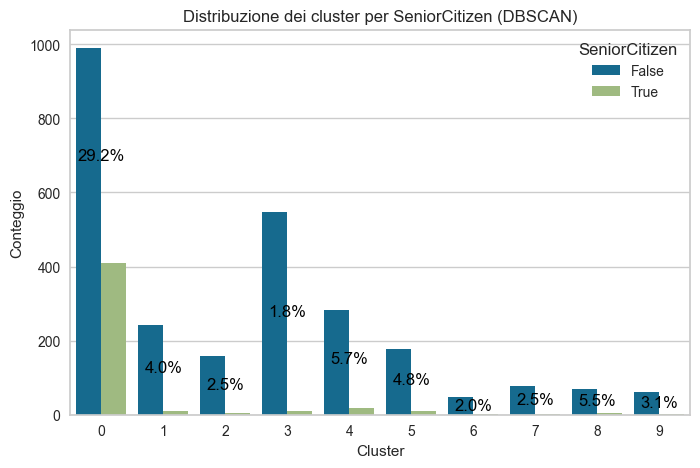

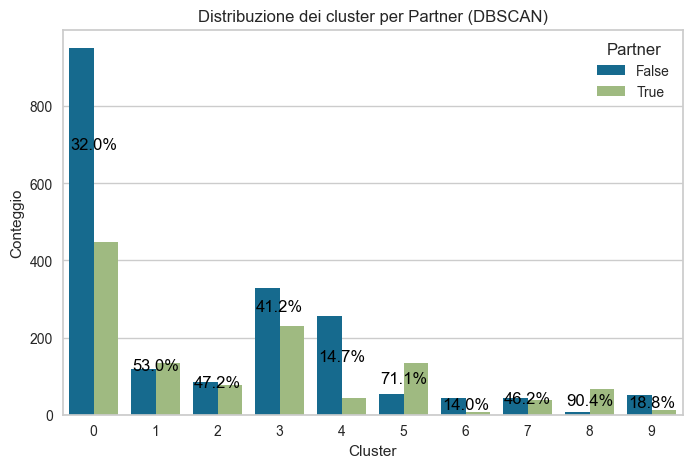

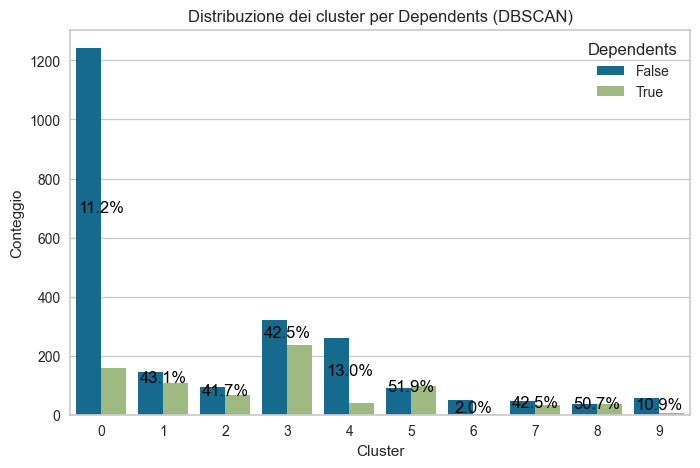

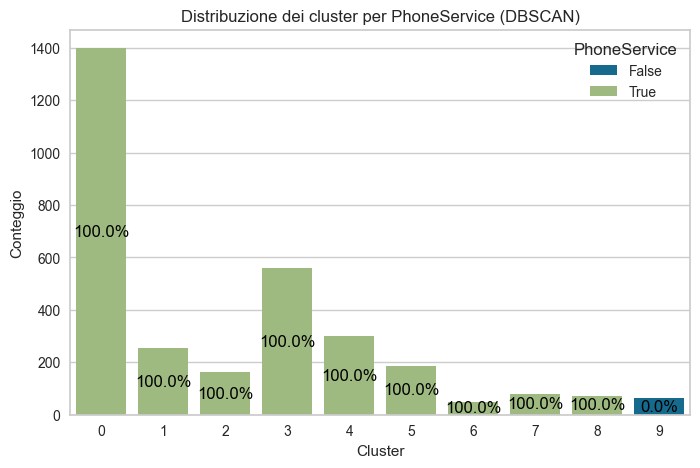

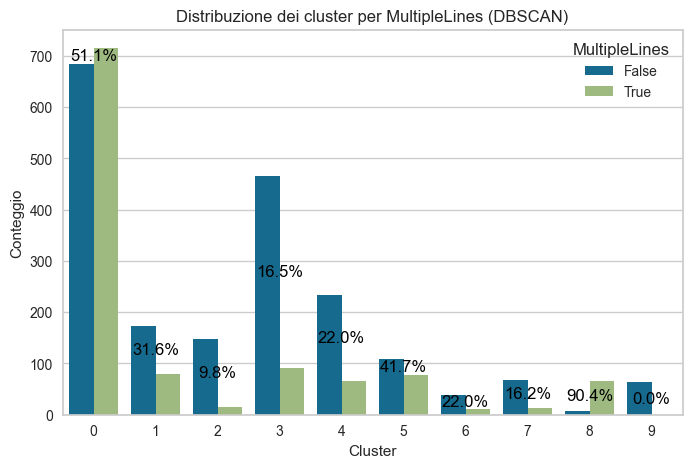

...

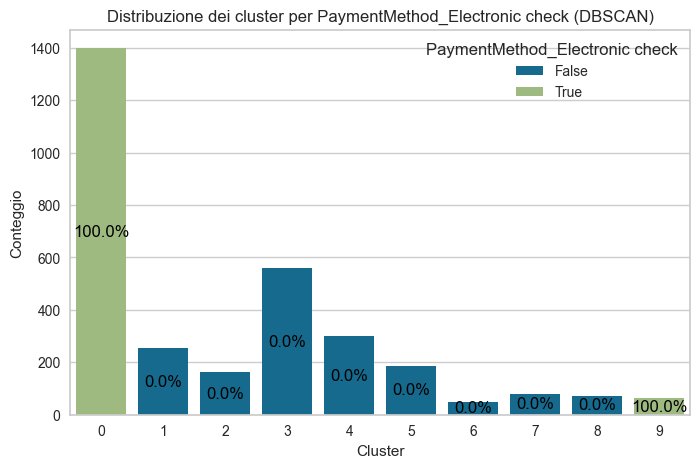

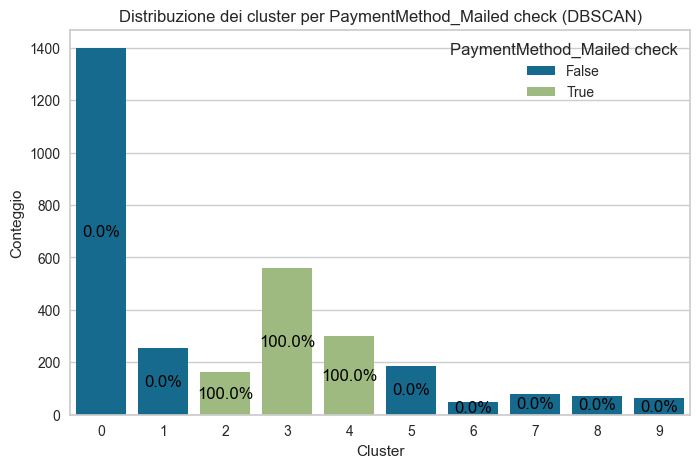

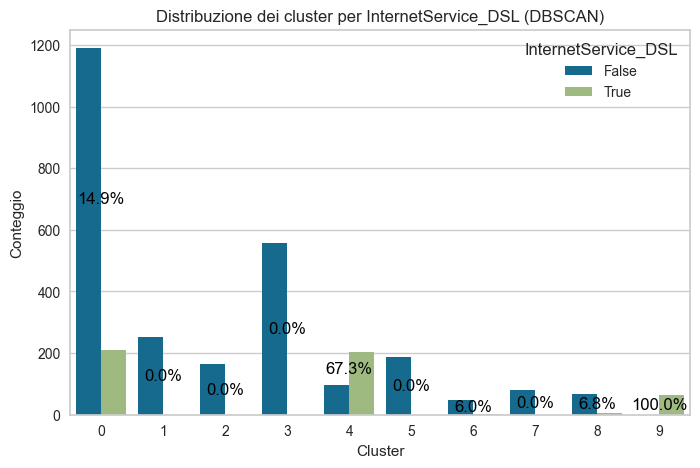

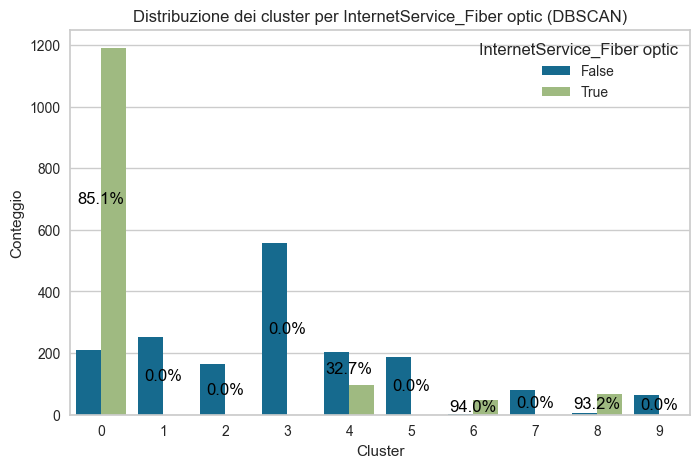

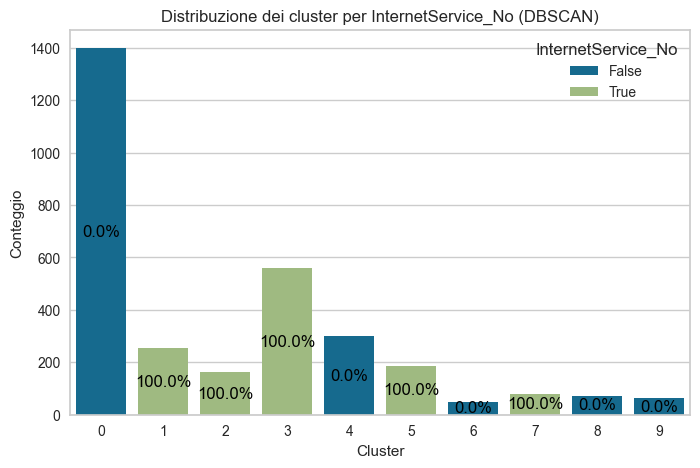

InternetService_No: 0.2500
PaymentMethod_Bank transfer (automatic): 0.2100
PaymentMethod_Mailed check: 0.2100
Contract_Month-to-month: 0.2014
Contract_Two year: 0.1669
InternetService_Fiber optic: 0.1652
Contract_One year: 0.1600
PaymentMethod_Credit card (automatic): 0.1600
PaymentMethod_Electronic check: 0.1600
InternetService_DSL: 0.1103
PhoneService: 0.0900
StreamingMovies: 0.0880
StreamingTV: 0.0847
TechSupport: 0.0740
DeviceProtection: 0.0729
OnlineBackup: 0.0696
Churn: 0.0647
OnlineSecurity: 0.0635
MultipleLines: 0.0604
PaperlessBilling: 0.0579
Partner: 0.0552
Dependents: 0.0331
IsMale: 0.0084
SeniorCitizen: 0.0061


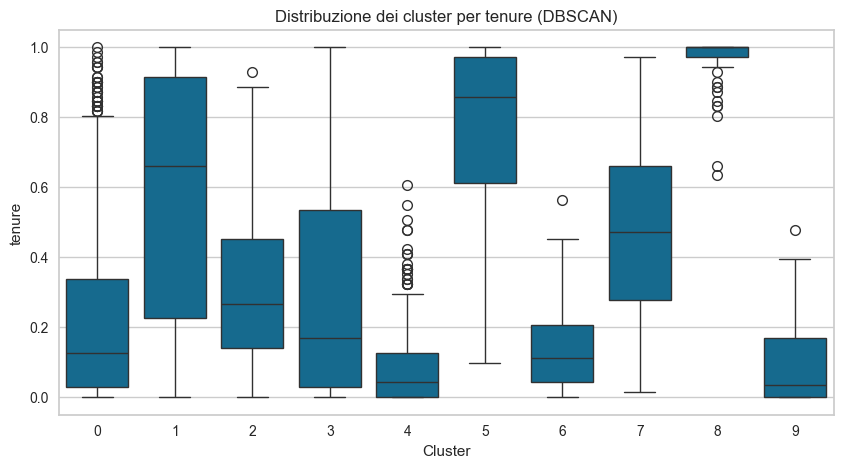

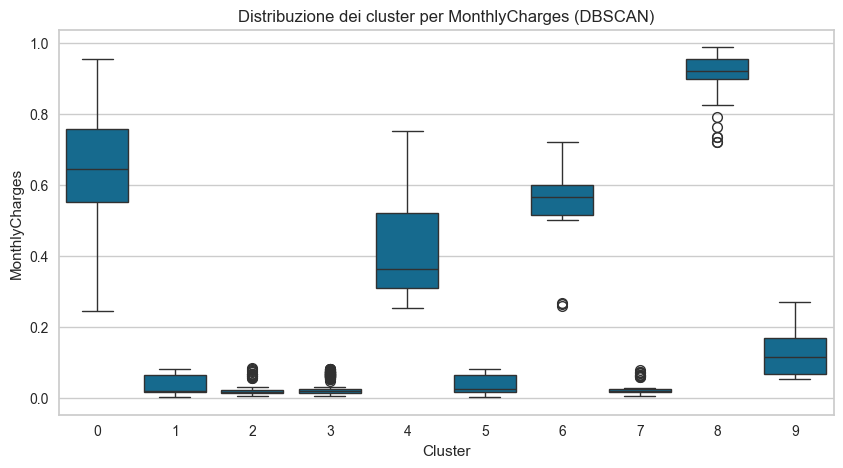

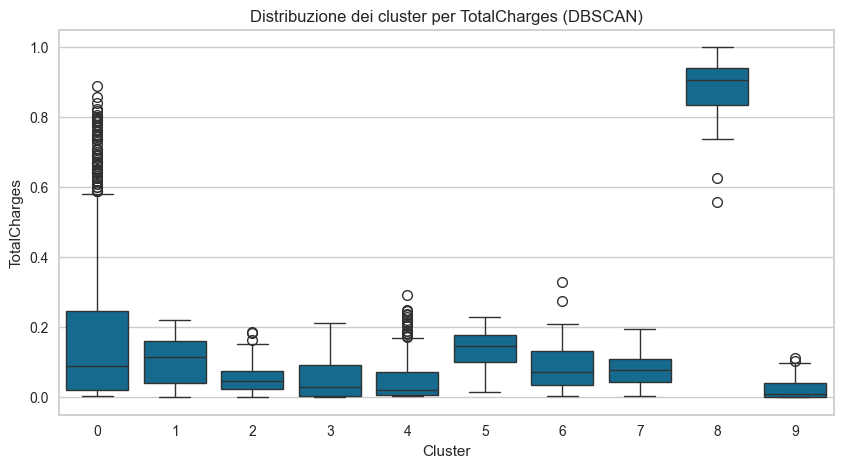

In [29]:
# Trova le colonne booleane e numeriche
bool_features = df_rescaled_dbscan.select_dtypes(include=[bool]).columns
num_features = df_rescaled_dbscan.select_dtypes(include=[np.number]).columns
num_features = [col for col in num_features if not col.startswith('clusters')]

# Ricava le etichette dei cluster
cluster_labels = sorted(df_rescaled_dbscan['clusters_dbscan'].unique())

# Dizionario per salvare le varianze
var_dict = defaultdict(float)

# --- Grafici per feature booleane ---
for col in bool_features:
    plt.figure(figsize=(8, 5))
    ax = sns.countplot(data=df_rescaled_dbscan, x='clusters_dbscan', hue=col)
    plt.title(f'Distribuzione dei cluster per {col} (DBSCAN)')
    plt.xlabel('Cluster')
    plt.ylabel('Conteggio')
    plt.legend(title=col)

    list_of_percentages = []

    for label in cluster_labels:
        subset = df_rescaled_dbscan[df_rescaled_dbscan['clusters_dbscan'] == label]
        total = subset[col].count()
        if total == 0:
            pct = 0
        else:
            pct = subset[col].sum() / total

        list_of_percentages.append(pct)

        # Calcolo la posizione dell’etichetta nel grafico
        pos = np.where(cluster_labels == label)[0][0] if isinstance(cluster_labels, np.ndarray) else cluster_labels.index(label)
        height = subset.shape[0] / 2
        plt.text(pos, height, f'{pct:.1%}', ha='center', va='center', color='black')

    var_dict[col] = np.var(list_of_percentages)
    plt.show()

# --- Stampa varianze ordinate ---
sorted_var_dict = sorted(var_dict.items(), key=lambda x: x[1], reverse=True)
for key, value in sorted_var_dict:
    print(f'{key}: {value:.4f}')

# --- Boxplot per feature numeriche ---
for col in num_features:
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df_rescaled_dbscan, x='clusters_dbscan', y=col)
    plt.title(f'Distribuzione dei cluster per {col} (DBSCAN)')
    plt.xlabel('Cluster')
    plt.ylabel(col)
    plt.show()


/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



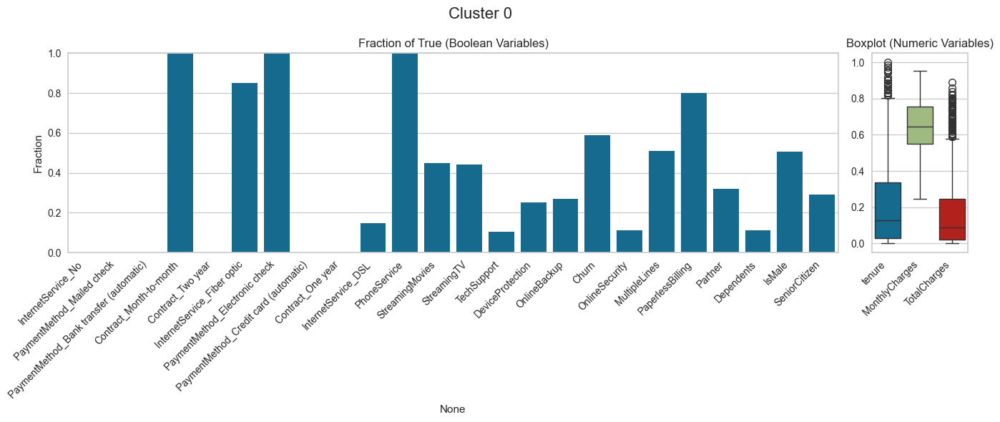

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



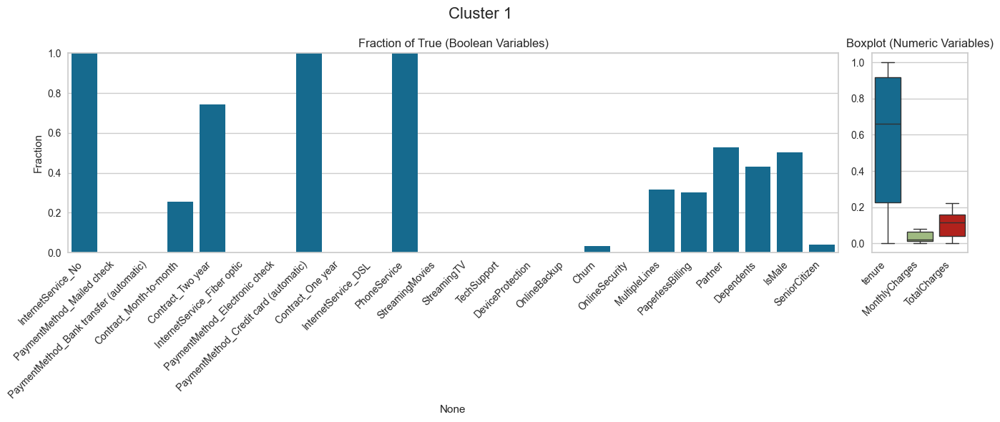

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



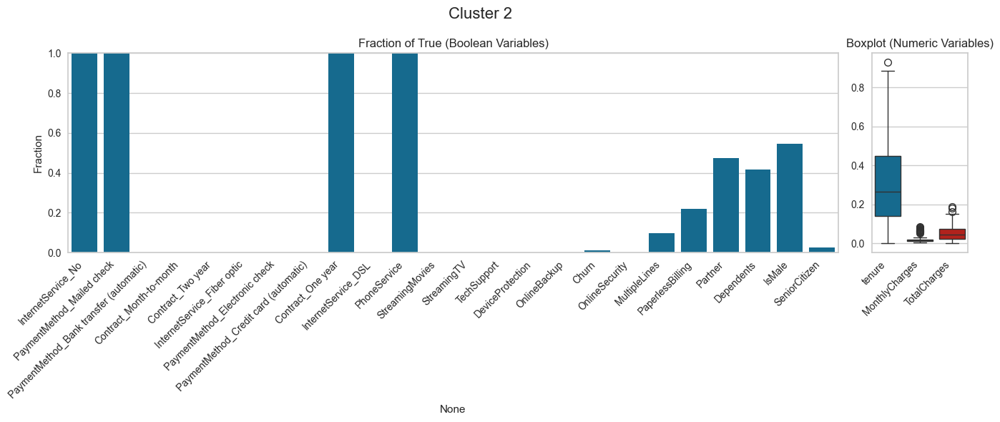

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



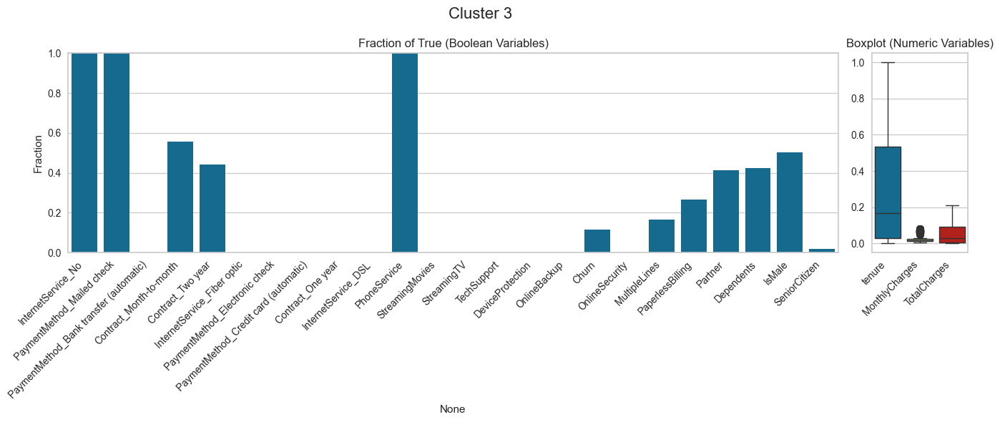

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



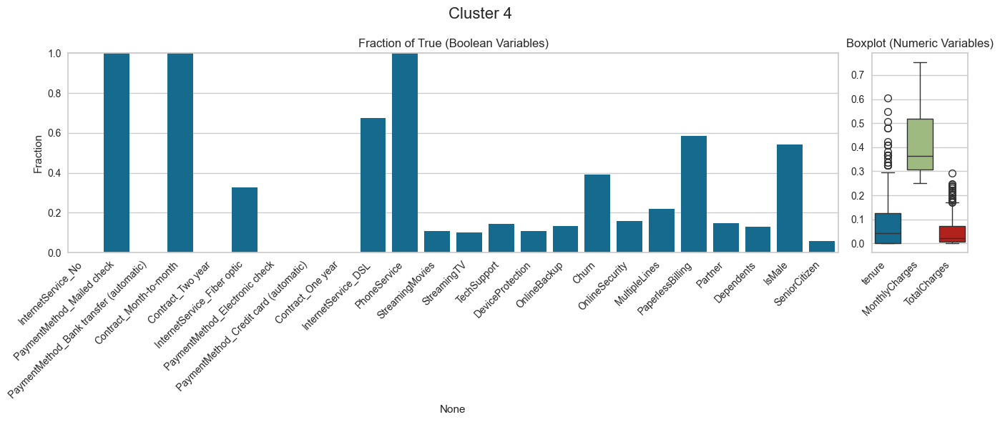

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



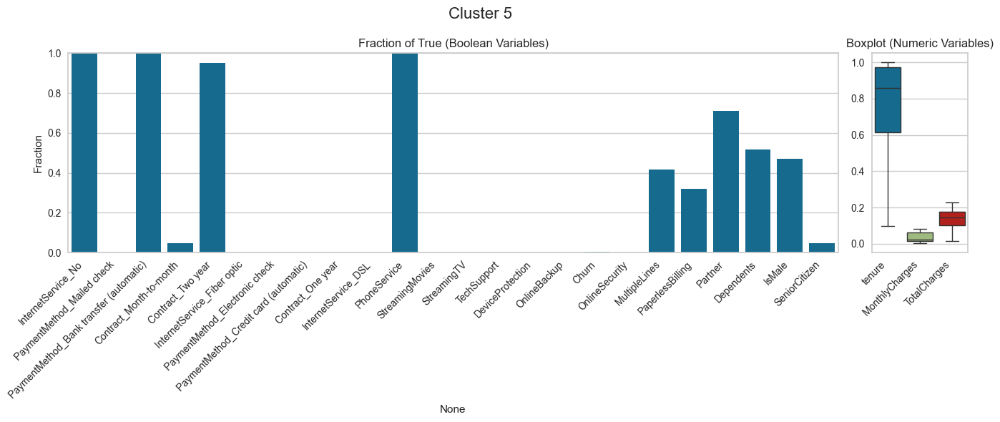

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



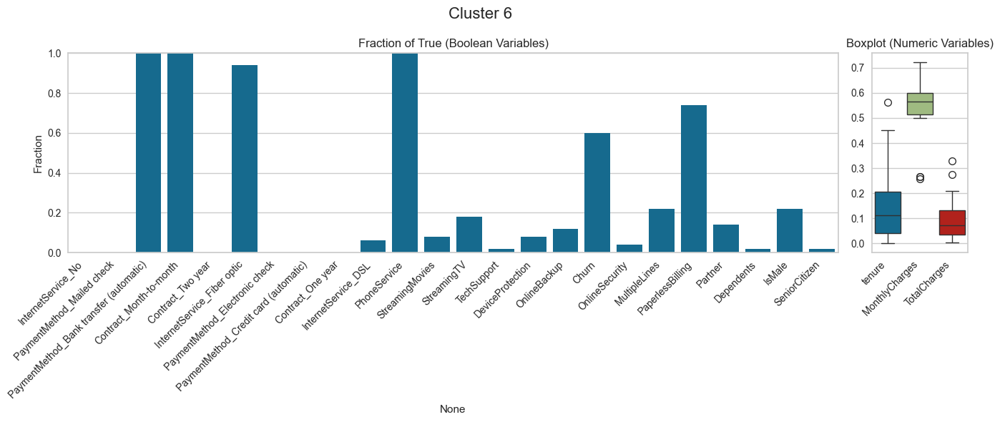

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



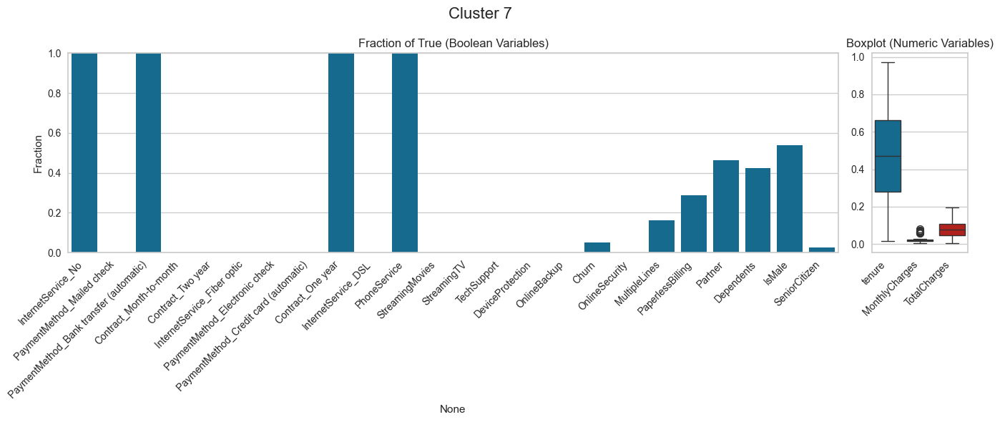

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



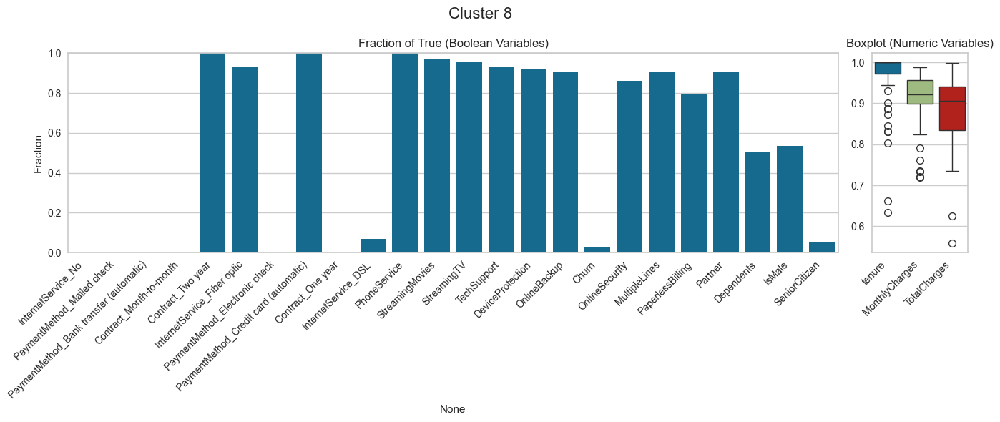

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/3328539861.py:66: UserWarning:

The figure layout has changed to tight



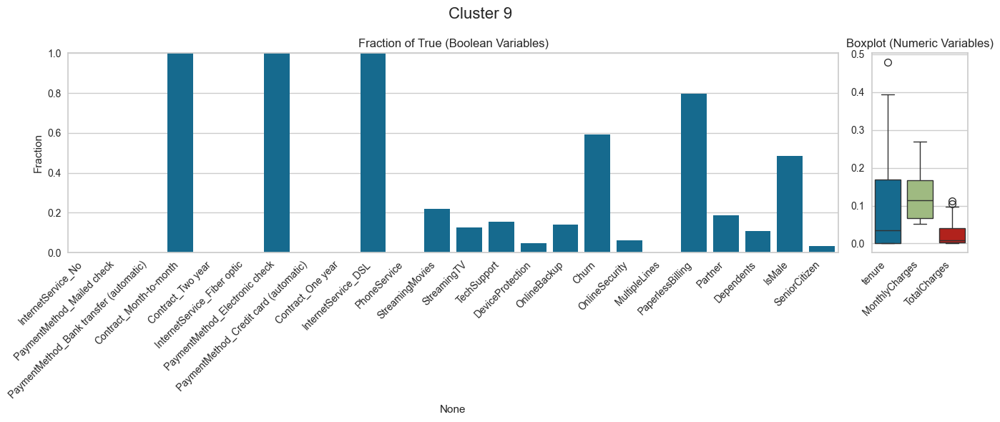

In [63]:
# summary of each cluster
plot_cluster_distributions(df_rescaled_dbscan, var_dict, 'clusters_dbscan')

In [61]:
#print cluster info
print_cluster_info(df_rescaled_dbscan, 'clusters_dbscan', bool_features, num_features)

Cluster 9:
Numerical features:
tenure: mean = 0.09, std = 0.12
MonthlyCharges: mean = 0.12, std = 0.06
TotalCharges: mean = 0.02, std = 0.03
Boolean features:
SeniorCitizen: 3.12% True, 96.88% False
Partner: 18.75% True, 81.25% False
Dependents: 10.94% True, 89.06% False
PhoneService: 0.00% True, 100.00% False
MultipleLines: 0.00% True, 100.00% False
OnlineSecurity: 6.25% True, 93.75% False
OnlineBackup: 14.06% True, 85.94% False
DeviceProtection: 4.69% True, 95.31% False
TechSupport: 15.62% True, 84.38% False
StreamingTV: 12.50% True, 87.50% False
StreamingMovies: 21.88% True, 78.12% False
PaperlessBilling: 79.69% True, 20.31% False
Churn: 59.38% True, 40.62% False
Contract_Month-to-month: 100.00% True, 0.00% False
Contract_One year: 0.00% True, 100.00% False
Contract_Two year: 0.00% True, 100.00% False
PaymentMethod_Bank transfer (automatic): 0.00% True, 100.00% False
PaymentMethod_Credit card (automatic): 0.00% True, 100.00% False
PaymentMethod_Electronic check: 100.00% True, 0.00% 

# Hierarchical

In [31]:

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform
# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram

from sklearn.cluster import AgglomerativeClustering

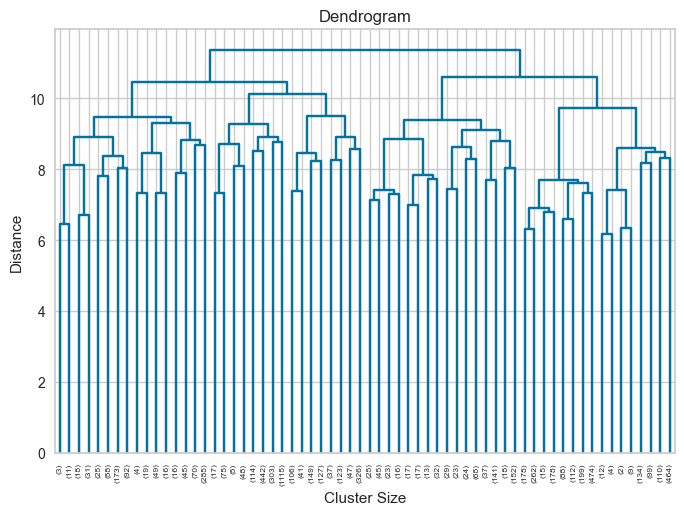

In [32]:
data_dist = pdist(X, metric='euclidean')
data_link = linkage(data_dist, method='complete')

res = dendrogram(data_link, truncate_mode='level', p=5, color_threshold=0.5)
plt.title('Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()


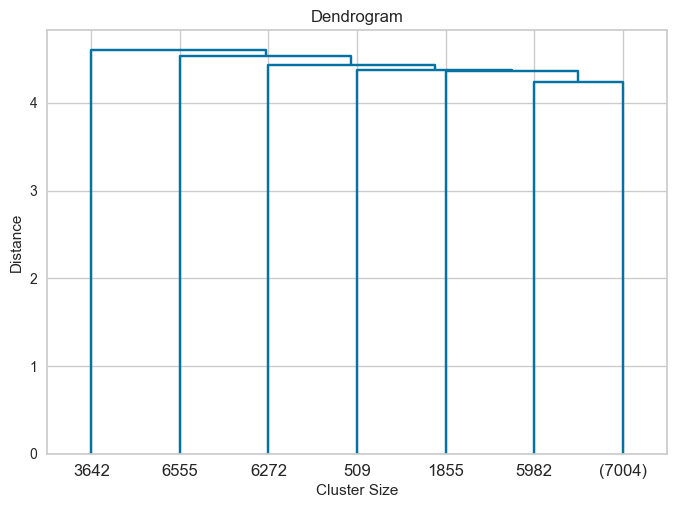

In [33]:
# single linkage
data_link = linkage(data_dist, method='single')
res = dendrogram(data_link, truncate_mode='level', p=5, color_threshold=0.5)
plt.title('Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()

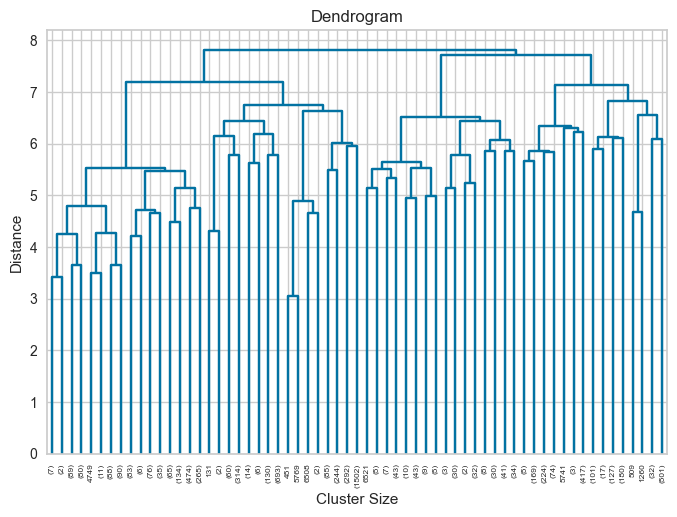

In [34]:
# group average linkage
data_link = linkage(data_dist, method='average')
res = dendrogram(data_link, truncate_mode='level', p=5, color_threshold=2.5)
plt.title('Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()

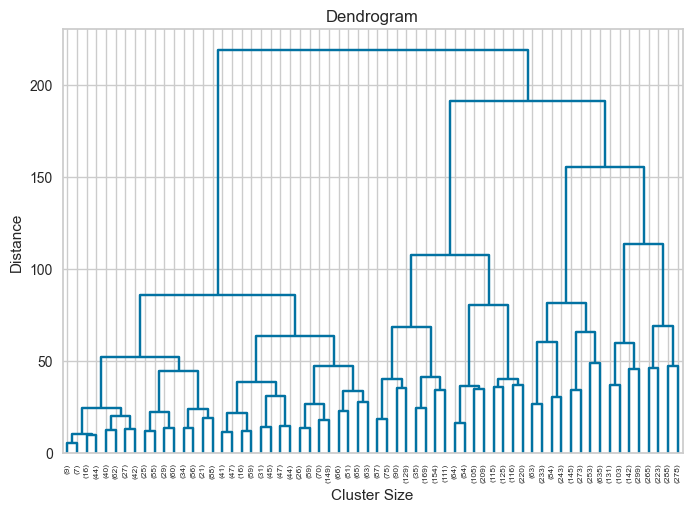

In [35]:
# ward's linkage
data_link = linkage(data_dist, method='ward')
res = dendrogram(data_link, truncate_mode='level', p=5, color_threshold=0.5)
plt.title('Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()

In [36]:
hier = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
hier.fit(X)
df_pca['clusters_hier_ward'] = hier.labels_

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1006: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/1949122859.py:3: UserWarning:

The palette list has more values (10) than needed (7), which may not be intended.



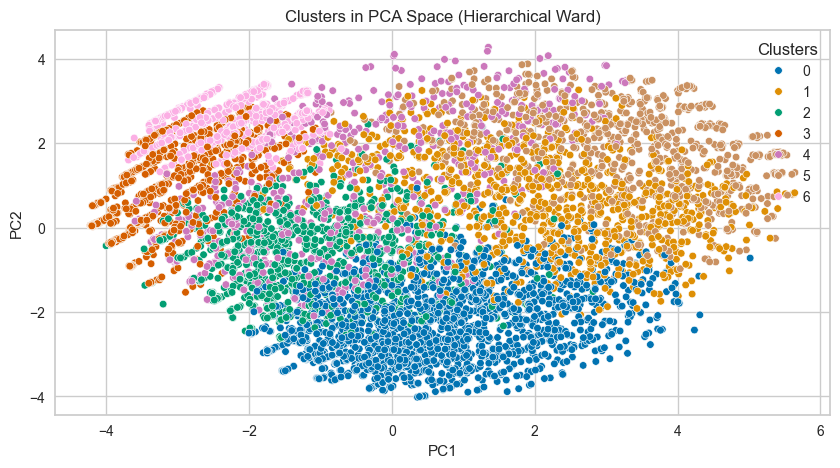

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/1949122859.py:11: UserWarning:

The palette list has more values (10) than needed (7), which may not be intended.



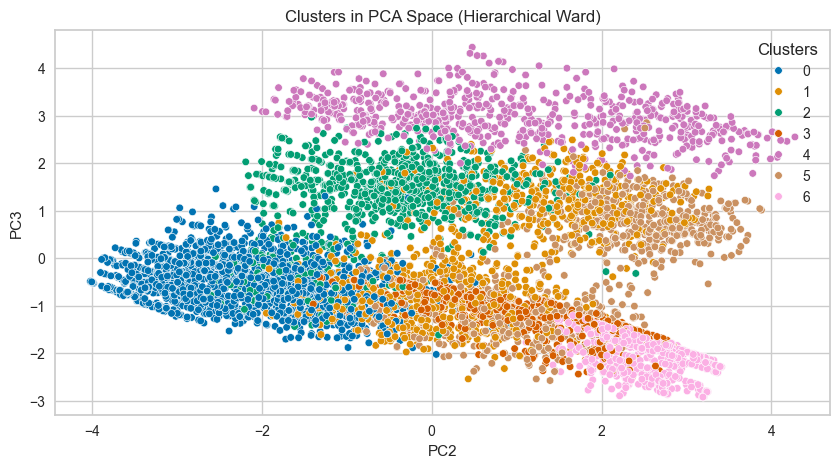

/var/folders/7t/860dclk54774ltwycrvfp7nc0000gn/T/ipykernel_3239/1949122859.py:19: UserWarning:

The palette list has more values (10) than needed (7), which may not be intended.



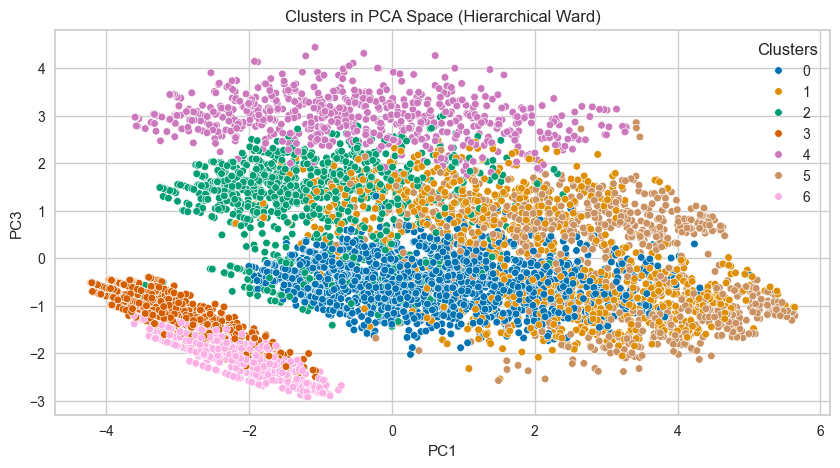

In [37]:
# plot the clusters found in the pca space
plt.figure(figsize=(10, 5))
sns.scatterplot(x='PC1', y='PC2', hue='clusters_hier_ward', data=df_pca, palette=colors, s=30)
plt.title('Clusters in PCA Space (Hierarchical Ward)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 5))
sns.scatterplot(x='PC2', y='PC3', hue='clusters_hier_ward', data=df_pca, palette=colors, s=30)
plt.title('Clusters in PCA Space (Hierarchical Ward)')
plt.xlabel('PC2')
plt.ylabel('PC3')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 5))
sns.scatterplot(x='PC1', y='PC3', hue='clusters_hier_ward', data=df_pca, palette=colors, s=30)
plt.title('Clusters in PCA Space (Hierarchical Ward)')
plt.xlabel('PC1')
plt.ylabel('PC3')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.show()

In [38]:
# 3d plot
import plotly.express as px
fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='clusters_hier_ward', title='Clusters in PCA Space (Hierarchical Ward)')
fig.update_traces(marker=dict(size=3))
fig.update_layout(scene=dict(
                    xaxis_title='PC1',
                    yaxis_title='PC2',
                    zaxis_title='PC3'))
fig.show()


In [39]:
hier = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='average')
hier.fit(X)
df_pca['clusters_hier_average'] = hier.labels_

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1006: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



In [40]:
# 3d plot
import plotly.express as px
fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='clusters_hier_average', title='Clusters in PCA Space (Hierarchical Ward)')
fig.update_traces(marker=dict(size=3))
fig.update_layout(scene=dict(
                    xaxis_title='PC1',
                    yaxis_title='PC2',
                    zaxis_title='PC3'))
fig.show()


In [41]:
hier = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='single')
hier.fit(X)
df_pca['clusters_hier_single'] = hier.labels_

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1006: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



In [42]:
# 3d plot
import plotly.express as px
fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='clusters_hier_single', title='Clusters in PCA Space (Hierarchical Ward)')
fig.update_traces(marker=dict(size=3))
fig.update_layout(scene=dict(
                    xaxis_title='PC1',
                    yaxis_title='PC2',
                    zaxis_title='PC3'))
fig.show()


In [43]:
hier = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='complete')
hier.fit(X)
df_pca['clusters_hier_complete'] = hier.labels_

/usr/local/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1006: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



In [44]:
# 3d plot
import plotly.express as px
fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='clusters_hier_complete', title='Clusters in PCA Space (Hierarchical Ward)')
fig.update_traces(marker=dict(size=3))
fig.update_layout(scene=dict(
                    xaxis_title='PC1',
                    yaxis_title='PC2',
                    zaxis_title='PC3'))
fig.show()


# Comparison between results

In [45]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

In [46]:
results= {}

In [47]:
label_columns = ['clusters', 'clusters_dbscan', 'clusters_hier_ward', 'clusters_hier_average', 'clusters_hier_single', 'clusters_hier_complete']

In [48]:
for col in label_columns:
    labels = df_pca[col]
    
    # DBSCAN può generare -1 (outlier) → li escludiamo per silhouette e CH
    if len(set(labels)) > 1 and (labels != -1).sum() > 1:
        mask = labels != -1
        results[col] = {
            'Silhouette': silhouette_score(X[mask], labels[mask]),
            'Calinski-Harabasz': calinski_harabasz_score(X[mask], labels[mask]),
            'Davies-Bouldin': davies_bouldin_score(X[mask], labels[mask])
        }
    else:
        results[col] = {
            'Silhouette': None,
            'Calinski-Harabasz': None,
            'Davies-Bouldin': None
        }

# converto in DataFrame
scores_df = pd.DataFrame(results).T

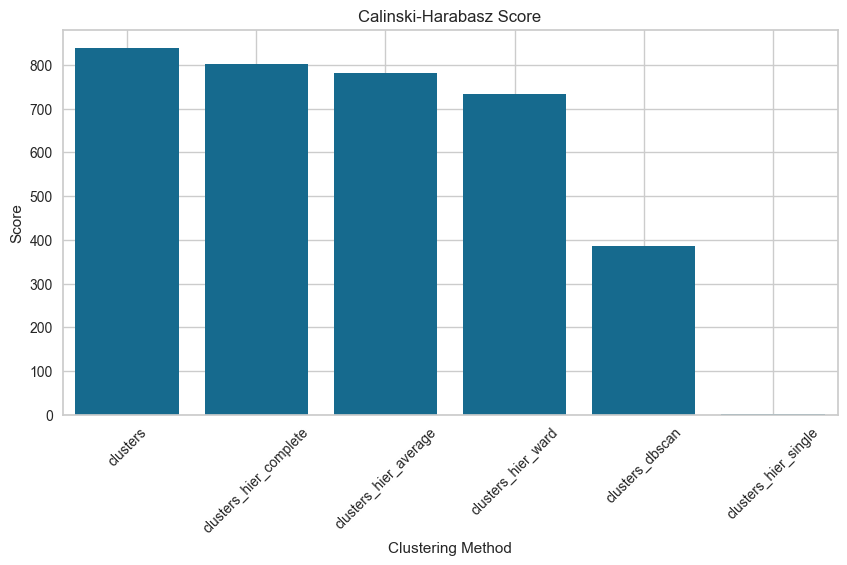

In [49]:
# bar plot ordered by calinski-harabasz score
plt.figure(figsize=(10, 5))
scores_df = scores_df.sort_values(by='Calinski-Harabasz', ascending=False)
sns.barplot(x=scores_df.index, y='Calinski-Harabasz', data=scores_df)
plt.title('Calinski-Harabasz Score')
plt.xlabel('Clustering Method')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


In [50]:
scores_df

,Silhouette,Calinski-Harabasz,Davies-Bouldin
clusters,0.134388,838.415150,2.192101
clusters_hier_complete,0.140719,802.136304,2.271798
clusters_hier_average,0.154223,781.315251,2.118802
clusters_hier_ward,0.127726,733.134051,2.276395
clusters_dbscan,0.180492,386.018306,1.468290
clusters_hier_single,-0.071615,1.240939,0.907610
